# PART 2
## Filter cells

Cells with low library size and low number of genes will be filtered out.

- **INPUT:**
    - ```$counts.RData``` 
    - ```anno_cells.RData```
    - ```anno_samples.RData```
    - ```anno_genes.RData```
    
- **NOTES:**

    The '_ctf' ending in the file names stands for cell type filter.
    
- **OUTPUT:**

    -  ```counts_cf.RData``` 
    -  ```anno_cells_cf.RData``` 
    -  ```anno_samples_cf.RData``` 
    -  ```anno_genes_cf.RData``` 

In [5]:
library(ggplot2)
library(Matrix)
library(dplyr)


Attaching package: ‘dplyr’


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union




In [112]:
getwd()

[1] "/home/mami/Maria/polish/clean/community-paper/src/data_preprocessing/Smillie"

In [6]:
path <- "../../..//results//data_preprocessing//Similie/preprocessed/"
print("path is:")
print(path)

[1] "path is:"
[1] "../../..//results//data_preprocessing//Similie/preprocessed/"


In [7]:
options(repr.plot.width=15,repr.plot.height=8)

In [8]:
load(paste0(path,"/counts.RData"))
print(dim(counts))

[1]  21784 365492


In [9]:
print(counts[1:5,1:5])
"genes" %in% rownames(counts)

5 x 5 sparse Matrix of class "dgCMatrix"
         N7.EpiA.AAACATACACACTG N7.EpiA.AAACCGTGCATCAG N7.EpiA.AAACGCACAATCGC
7SK                           .                      .                      .
A1BG                          .                      .                      .
A1BG-AS1                      .                      .                      .
A1CF                          .                      .                      .
A2M                           .                      .                      .
         N7.EpiA.AAAGATCTAACCGT N7.EpiA.AAAGATCTAGGCGA
7SK                           .                      .
A1BG                          .                      .
A1BG-AS1                      .                      .
A1CF                          .                      .
A2M                           .                      .


[1] FALSE

In [10]:
load((paste0(path,"/anno_cells.RData")))
rownames(anno_cells) <- anno_cells$cell_ID
print(str(anno_cells))
tail(anno_cells$region)

'data.frame':	235229 obs. of  7 variables:
 $ cell_ID           : chr  "N10.EpiA.AACATTGAAAGTAG" "N10.EpiA.AACCCAGACGTAAC" "N10.EpiA.AATCTCACCGCATA" "N10.EpiA.ACAATAACCGCTAA" ...
 $ cell_type_original: chr  "Stem" "Stem" "Stem" "Stem" ...
 $ tissue_type       : chr  "Epithelial" "Epithelial" "Epithelial" "Epithelial" ...
 $ cell_type         : chr  "Stem and multipotent cells" "Stem and multipotent cells" "Stem and multipotent cells" "Stem and multipotent cells" ...
 $ region            : chr  "Healthy" "Healthy" "Healthy" "Healthy" ...
 $ sample_ID         : chr  "N10.A_Healthy" "N10.A_Healthy" "N10.A_Healthy" "N10.A_Healthy" ...
 $ health_status     : chr  "Healthy" "Healthy" "Healthy" "Healthy" ...
NULL


[1] "Inflamed" "Inflamed" "Inflamed" "Inflamed" "Inflamed" "Inflamed"

In [11]:
# load sample annotation
load((paste0(path,"/anno_samples.RData")))
print(str(anno_samples))

'data.frame':	48 obs. of  5 variables:
 $ sample_ID      : chr  "N10.A_Healthy" "N10.B_Healthy" "N8.A_Healthy" "N8.B_Healthy" ...
 $ patient_ID     : chr  "N10" "N10" "N8" "N8" ...
 $ region         : chr  "Healthy" "Healthy" "Healthy" "Healthy" ...
 $ case_or_control: chr  "control" "control" "control" "control" ...
 $ health_status  : chr  "Healthy" "Healthy" "Healthy" "Healthy" ...
NULL


In [12]:
print(length(unique(anno_samples$sample_ID)))

[1] 48


In [13]:
# load gene annotation
load((paste0(path,"/anno_genes.RData")))
print(str(anno_genes))

'data.frame':	21784 obs. of  4 variables:
 $ gene_symbol: chr  "7SK" "A1BG" "A1BG-AS1" "A1CF" ...
 $ inDB       : logi  FALSE TRUE FALSE FALSE TRUE FALSE ...
 $ isLigand   : logi  FALSE FALSE FALSE FALSE TRUE FALSE ...
 $ isReceptor : logi  FALSE TRUE FALSE FALSE FALSE FALSE ...
NULL


### process data

In [14]:
# check whether the cell IDs are the same in the counts and cell annotation files
cell_ID_overlap <- intersect(colnames(counts)
                             ,anno_cells$cell_ID)
print("str(cell_ID_overlap)")
print(str(cell_ID_overlap))

[1] "str(cell_ID_overlap)"
 chr [1:235229] "N7.EpiB.AAACATACGGTAAA" "N7.EpiB.AAATCCCTTGGTCA" ...
NULL


In [15]:
# print out cells that are present in the raw counts, but not in the intersection
print(str(colnames(counts)[!(colnames(counts) %in% cell_ID_overlap)]))

 chr [1:130263] "N7.EpiA.AAACATACACACTG" "N7.EpiA.AAACCGTGCATCAG" ...
NULL


In [16]:
# print out cells that present in the cell annotation, but not in the intersection
print(str(anno_cells$cell_ID[!(anno_cells$cell_ID %in% cell_ID_overlap)]))

 chr(0) 
NULL


### filter

In [17]:
# filter cells by their presence in the cell annotation file
counts_cf <- counts[, anno_cells$cell_ID]
print("nr cell before filtering")
print(ncol(counts))
print("nr cell after filtering")
print(ncol(counts_cf))

[1] "nr cell before filtering"
[1] 365492
[1] "nr cell after filtering"
[1] 235229


In [18]:
# calculate total counts
anno_cells$total_counts_raw <- colSums(counts_cf)

In [19]:
# calculate nr genes
anno_cells$nr_genes <- colSums(counts_cf != 0)

### Visualisation

In [20]:
#cell filter thresholds
anno_cells$counts_upper_threshold <- 30000
anno_cells$counts_lower_threshold <- 1000
anno_cells$genes_lower_threshold <- 500
#anno_cells$counts_vs_genes_threshold <- "nr_genes = 3100*log10(counts+1) - 11000"
#counts_vs_genes_threshold <- function(counts ,genes){genes > 3100*log10(counts +1) - 11000}

In [21]:
print(paste("counts_upper_threshold: <", anno_cells$counts_upper_threshold[1]))
print(paste("counts_lower_threshold: >",anno_cells$counts_lower_threshold[1]))
print(paste("genes_lower_threshold: >", anno_cells$genes_lower_threshold[1]))
#print(paste("counts_vs_genes_threshold:",anno_cells$counts_vs_genes_threshold[1]))

[1] "counts_upper_threshold: < 30000"
[1] "counts_lower_threshold: > 1000"
[1] "genes_lower_threshold: > 500"


In [22]:
anno_cells$counts_upper_filter <- anno_cells$total_counts_raw < anno_cells$counts_upper_threshold
anno_cells$counts_lower_filter <- anno_cells$total_counts_raw > anno_cells$counts_lower_threshold
anno_cells$genes_lower_filter <- anno_cells$nr_genes > anno_cells$genes_lower_threshold
#anno_cells$counts_vs_genes_filter <- counts_vs_genes_threshold(anno_cells$total_counts_raw,anno_cells$nr_genes)
anno_cells$cell_filter <- anno_cells$counts_upper_filter & anno_cells$counts_lower_filter & 
        anno_cells$genes_lower_filter #& anno_cells$counts_vs_genes_filter

'data.frame':	235229 obs. of  2 variables:
 $ log10_lib_size: num  3.48 3.81 3.97 4.13 4.33 ...
 $ sample_ID     : Factor w/ 48 levels "N10.A_Healthy",..: 1 1 1 1 1 1 1 1 1 1 ...
NULL


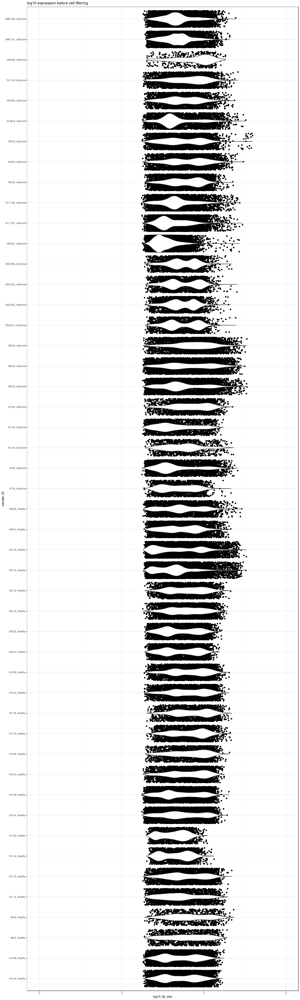

In [23]:
# visualize expression before any filtering
options(repr.plot.width=15,repr.plot.height=50)
df <- data.frame(log10_lib_size = log10(anno_cells$total_counts_raw +1)
                 ,sample_ID = anno_cells$sample_ID
)
df$sample_ID <- factor(df$sample_ID, levels = unique(df$sample_ID))
print(str(df))

print(ggplot(data = df,aes(x = sample_ID,y = log10_lib_size)
) +
        geom_jitter(height = NULL) +
        geom_violin() + 
        ggtitle("log10 expression before cell filtering") +
        coord_flip() +
        ylim(c(0,6))+
        theme_bw()
)
rm(df)

Warning message:
“The dot-dot notation (`..level..`) was deprecated in ggplot2 3.4.0.
ℹ Please use `after_stat(level)` instead.”


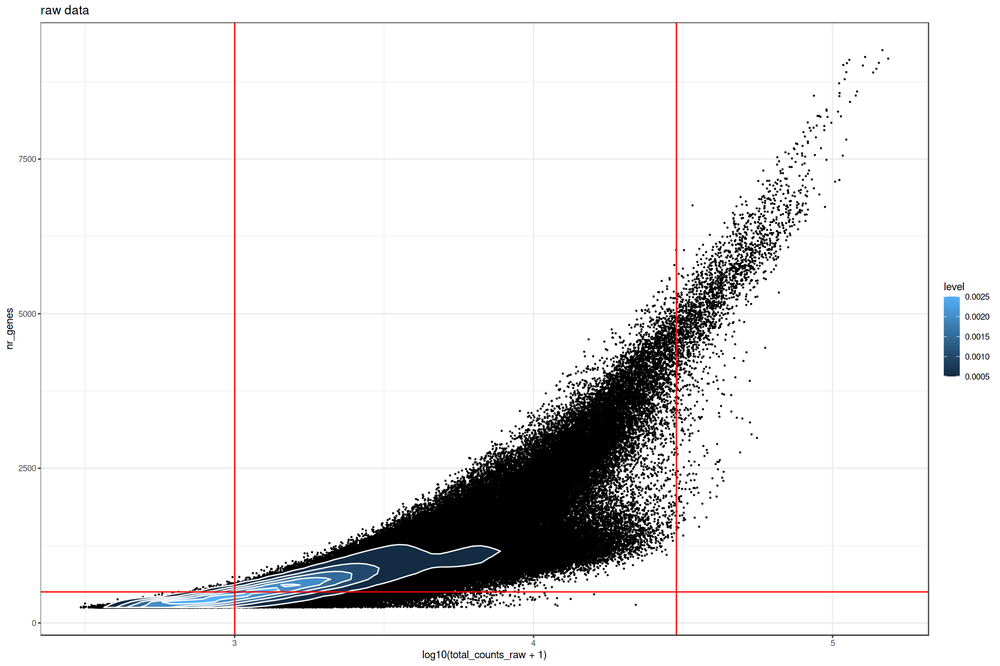

In [24]:
# plot log10 total counts vs nr genes
options(repr.plot.width=15,repr.plot.height=10)
print(ggplot(data = anno_cells,aes(x = log10(total_counts_raw +1),y = nr_genes)
) +
        geom_point(size = 0.05) +
        stat_density_2d(aes(fill = ..level..), geom = "polygon", colour="white") +
 #       geom_abline(intercept = -11000
 #                   ,slope = 3100
 #                   , col = "red"
  #      ) +
        geom_vline(xintercept = log10(c(anno_cells$counts_lower_threshold,anno_cells$counts_upper_threshold)+1)
                   ,col = "red") +
        geom_hline(yintercept = anno_cells$genes_lower_threshold
                   ,col = "red") +
        ggtitle("raw data")+
        theme_bw()
      )

In [25]:
#apply cell filters
anno_cells_cf <- anno_cells[anno_cells$cell_filter,]
print("before cell filtering:")
cat("dim(anno_cells)", dim(anno_cells),"\n")
print("after cell filtering:")
cat("dim(anno_cells_cf)", dim(anno_cells_cf),"\n")

[1] "before cell filtering:"
dim(anno_cells) 235229 16 
[1] "after cell filtering:"
dim(anno_cells_cf) 160707 16 


In [26]:
# save cell number in anno_samples
for(sample in unique(anno_cells$sample_ID)){
        
        my_anno <- anno_cells[anno_cells$sample_ID == sample,]
        my_anno_cf <- anno_cells_cf[anno_cells_cf$sample_ID == sample,]
        
        anno_samples$nr_cells_raw[anno_samples$sample_ID == sample] <- nrow(my_anno)
        anno_samples$nr_cells_cf[anno_samples$sample_ID == sample] <- nrow(my_anno_cf)
}
cat("anno_samples\n\n")
print(anno_samples)

anno_samples

          sample_ID patient_ID   region case_or_control health_status
1     N10.A_Healthy        N10  Healthy         control       Healthy
2     N10.B_Healthy        N10  Healthy         control       Healthy
3      N8.A_Healthy         N8  Healthy         control       Healthy
4      N8.B_Healthy         N8  Healthy         control       Healthy
5     N11.A_Healthy        N11  Healthy         control       Healthy
6     N11.B_Healthy        N11  Healthy         control       Healthy
7     N13.A_Healthy        N13  Healthy         control       Healthy
8     N13.B_Healthy        N13  Healthy         control       Healthy
9     N15.A_Healthy        N15  Healthy         control       Healthy
10    N15.B_Healthy        N15  Healthy         control       Healthy
11    N16.A_Healthy        N16  Healthy         control       Healthy
12    N16.B_Healthy        N16  Healthy         control       Healthy
13    N17.A_Healthy        N17  Healthy         control       Healthy
14    

In [27]:
# subset counts
print("counts dim:")
print("before cell filtering:")
print(dim(counts_cf))
print("subset counts")
counts_cf <- counts_cf[,anno_cells_cf$cell_ID]
print("after cell filtering:")
print(dim(counts_cf))

[1] "counts dim:"
[1] "before cell filtering:"
[1]  21784 235229
[1] "subset counts"
[1] "after cell filtering:"
[1]  21784 160707


In [28]:
str(anno_cells_cf)

'data.frame':	160707 obs. of  16 variables:
 $ cell_ID               : chr  "N10.EpiA.AACATTGAAAGTAG" "N10.EpiA.AACCCAGACGTAAC" "N10.EpiA.AATCTCACCGCATA" "N10.EpiA.ACAATAACCGCTAA" ...
 $ cell_type_original    : chr  "Stem" "Stem" "Stem" "Stem" ...
 $ tissue_type           : chr  "Epithelial" "Epithelial" "Epithelial" "Epithelial" ...
 $ cell_type             : chr  "Stem and multipotent cells" "Stem and multipotent cells" "Stem and multipotent cells" "Stem and multipotent cells" ...
 $ region                : chr  "Healthy" "Healthy" "Healthy" "Healthy" ...
 $ sample_ID             : chr  "N10.A_Healthy" "N10.A_Healthy" "N10.A_Healthy" "N10.A_Healthy" ...
 $ health_status         : chr  "Healthy" "Healthy" "Healthy" "Healthy" ...
 $ total_counts_raw      : num  2995 6527 9262 13631 21207 ...
 $ nr_genes              : int  1119 1534 2042 2666 3290 1773 1203 2477 3121 3534 ...
 $ counts_upper_threshold: num  30000 30000 30000 30000 30000 30000 30000 30000 30000 30000 ...
 $ counts_lower

In [29]:
# visualize expression after cell filtering and before population size filtering
df <- data.frame(log10_lib_size = log10(anno_cells_cf$total_counts_raw +1)
                 ,sample_ID = 
                 anno_cells_cf$sample_ID
)
df$sample_ID <- factor(df$sample_ID, levels = unique(df$sample_ID))
print(str(df))

'data.frame':	160707 obs. of  2 variables:
 $ log10_lib_size: num  3.48 3.81 3.97 4.13 4.33 ...
 $ sample_ID     : Factor w/ 48 levels "N10.A_Healthy",..: 1 1 1 1 1 1 1 1 1 1 ...
NULL


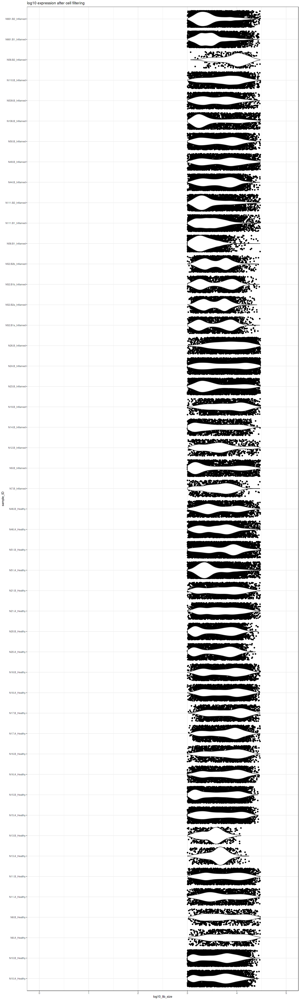

In [30]:
options(repr.plot.width=15,repr.plot.height=50)
print(ggplot(data = df,aes(x = sample_ID,y = log10_lib_size)) +
        geom_jitter(height = NULL) +
        geom_violin() + 
        ggtitle("log10 expression after cell filtering") +
        coord_flip() +
        ylim(c(0,5))+
        theme_bw() 
        #scale_y_continuous()
)
rm(df)

In [31]:
anno_samples_cf <- anno_samples %>% 
  arrange(region)

anno_genes_cf <- anno_genes

In [32]:
unique(anno_cells_cf$sample_ID)

[1] "N10.A_Healthy"    "N10.B_Healthy"    "N8.A_Healthy"     "N8.B_Healthy"    
 [5] "N11.A_Healthy"    "N11.B_Healthy"    "N13.A_Healthy"    "N13.B_Healthy"   
 [9] "N15.A_Healthy"    "N15.B_Healthy"    "N16.A_Healthy"    "N16.B_Healthy"   
[13] "N17.A_Healthy"    "N17.B_Healthy"    "N18.A_Healthy"    "N18.B_Healthy"   
[17] "N20.A_Healthy"    "N20.B_Healthy"    "N21.A_Healthy"    "N21.B_Healthy"   
[21] "N51.A_Healthy"    "N51.B_Healthy"    "N46.A_Healthy"    "N46.B_Healthy"   
[25] "N7.B_Inflamed"    "N9.B_Inflamed"    "N12.B_Inflamed"   "N14.B_Inflamed"  
[29] "N19.B_Inflamed"   "N23.B_Inflamed"   "N24.B_Inflamed"   "N26.B_Inflamed"  
[33] "N52.B1a_Inflamed" "N52.B2a_Inflamed" "N52.B1b_Inflamed" "N52.B2b_Inflamed"
[37] "N58.B1_Inflamed"  "N111.B1_Inflamed" "N111.B2_Inflamed" "N44.B_Inflamed"  
[41] "N49.B_Inflamed"   "N50.B_Inflamed"   "N106.B_Inflamed"  "N539.B_Inflamed" 
[45] "N110.B_Inflamed"  "N58.B2_Inflamed"  "N661.B1_Inflamed" "N661.B2_Inflamed"

In [33]:
unique(anno_cells_cf$cell_type)

[1] "Stem and multipotent cells" "Enterocytes"               
 [3] "M cells"                    "Goblet"                    
 [5] "Tuft"                       "Fibroblasts"               
 [7] "Vascular"                   "Glia"                      
 [9] "Macrophages"                "Myeloid"                   
[11] "Mast"                       "Nks"                       
[13] "ILCs"                       "CD4"                       
[15] "Tregs"                      "CD8"                       
[17] "Cycling T"                  "Plasma"                    
[19] "B-cells"

In [34]:
unique(anno_samples_cf$sample_ID)

[1] "N10.A_Healthy"    "N10.B_Healthy"    "N8.A_Healthy"     "N8.B_Healthy"    
 [5] "N11.A_Healthy"    "N11.B_Healthy"    "N13.A_Healthy"    "N13.B_Healthy"   
 [9] "N15.A_Healthy"    "N15.B_Healthy"    "N16.A_Healthy"    "N16.B_Healthy"   
[13] "N17.A_Healthy"    "N17.B_Healthy"    "N18.A_Healthy"    "N18.B_Healthy"   
[17] "N20.A_Healthy"    "N20.B_Healthy"    "N21.A_Healthy"    "N21.B_Healthy"   
[21] "N51.A_Healthy"    "N51.B_Healthy"    "N46.A_Healthy"    "N46.B_Healthy"   
[25] "N7.B_Inflamed"    "N9.B_Inflamed"    "N12.B_Inflamed"   "N14.B_Inflamed"  
[29] "N19.B_Inflamed"   "N23.B_Inflamed"   "N24.B_Inflamed"   "N26.B_Inflamed"  
[33] "N52.B1a_Inflamed" "N52.B2a_Inflamed" "N52.B1b_Inflamed" "N52.B2b_Inflamed"
[37] "N58.B1_Inflamed"  "N58.B2_Inflamed"  "N111.B1_Inflamed" "N111.B2_Inflamed"
[41] "N44.B_Inflamed"   "N49.B_Inflamed"   "N50.B_Inflamed"   "N106.B_Inflamed" 
[45] "N539.B_Inflamed"  "N110.B_Inflamed"  "N661.B1_Inflamed" "N661.B2_Inflamed"

## Filter cell types

Cell types which have too few cells (less than 5 cells) per sample or are present in too few samples (less than in 30 samples) will be filtered out.

- **INPUT:**
    - ```counts_cf.RData``` 
    - ```anno_cells_cf.RData```
    - ```anno_samples_cf.RData```
    - ```anno_genes_cf.RData```
    - ```cell_relabelling.csv``` file containing unified cell type annotations. Stored in additional_input_files sub-directory.
    
- **NOTES:**

    The '_ctf' ending in the file names stands for cell type filter.
    
- **OUTPUT:**

    -  ```counts_cf_ctf.RData``` 
    -  ```anno_cells_cf_ctf.RData``` 
    -  ```anno_samples_cf_ctf.RData``` 
    -  ```anno_genes_cf_ctf.RData``` 

In [37]:
# load cell relabelling file
print("load cell_relabelling")

file="cell_relabelling.csv"
cell_relabelling <- read.csv(file = "../../../data/Simillie//raw_data//cell_relabelling.csv", sep = ";")
rownames(cell_relabelling) <- cell_relabelling$cell_type_original
print(str(cell_relabelling))

[1] "load cell_relabelling"
'data.frame':	51 obs. of  6 variables:
 $ cell_type_original      : chr  "Stem" "TA 1" "TA 2" "Cycling TA" ...
 $ tissue_type             : chr  "Epithelial" "Epithelial" "Epithelial" "Epithelial" ...
 $ cell_type_original_color: chr  "#CB4335" "#CB4335" "#CB4335" "#CB4335" ...
 $ cell_type_color         : chr  "#c68642" "#c68642" "#c68642" "#c68642" ...
 $ population_shape        : int  19 19 19 19 19 19 19 19 19 19 ...
 $ cell_type               : chr  "Stem and multipotent cells" "Stem and multipotent cells" "Stem and multipotent cells" "Stem and multipotent cells" ...
NULL


In [38]:
# thresholds ####
threshold_celltype_size <- 5 # cells per celltype
print(paste("Celltype size filter: each cell type in each sample should have at least", threshold_celltype_size, "cells."))

[1] "Celltype size filter: each cell type in each sample should have at least 5 cells."


In [39]:
threshold_nr_samples <- 40 # nr of samples in which a cell type should be present
print(paste("Number of samples filter: each cell type should be present in at least", threshold_nr_samples, "samples."))

[1] "Number of samples filter: each cell type should be present in at least 40 samples."


In [40]:
# color scheme for celltypes
color_celltype <- cell_relabelling$cell_type_color[!duplicated(cell_relabelling$cell_type)]
names(color_celltype) <- cell_relabelling$cell_type[!duplicated(cell_relabelling$cell_type)]
print(color_celltype)

Stem and multipotent cells                Enterocytes 
                 "#c68642"                  "#e0ac69" 
                   M cells                     Goblet 
                 "#f1c27d"                  "#8d5523" 
                      Tuft                Fibroblasts 
                 "#ffdbac"                  "#d896ff" 
                  Vascular                       Glia 
                 "#be29ec"                  "#660066" 
               Macrophages                    Myeloid 
                 "#b3cde0"                  "#6497b1" 
                      Mast                        Nks 
                 "#005b96"                  "#43e8d8" 
                      ILCs                        CD4 
                 "#b3ecec"                  "#011f4b" 
                     Tregs                        CD8 
                 "#428bca"                  "#71c7ec" 
                 Cycling T                     Plasma 
                 "#107dac"                  "#189ad3" 
          

In [41]:
# shape scheme for celltypes
shape_celltype <- cell_relabelling$population_shape[!duplicated(cell_relabelling$cell_type)]
names(shape_celltype) <- cell_relabelling$cell_type[!duplicated(cell_relabelling$cell_type)]
print(shape_celltype)

Stem and multipotent cells                Enterocytes 
                        19                         19 
                   M cells                     Goblet 
                        19                         19 
                      Tuft                Fibroblasts 
                        19                         15 
                  Vascular                       Glia 
                        15                         14 
               Macrophages                    Myeloid 
                        13                         13 
                      Mast                        Nks 
                        13                         12 
                      ILCs                        CD4 
                        12                         12 
                     Tregs                        CD8 
                        12                         12 
                 Cycling T                     Plasma 
                        12                          9 
          

In [42]:
# sample scheme for sample IDs
shape_sample <- c(rep(1,24),rep(2,24))
names(shape_sample) <- unique(anno_samples_cf$sample_ID)
print(shape_sample)

   N10.A_Healthy    N10.B_Healthy     N8.A_Healthy     N8.B_Healthy 
               1                1                1                1 
   N11.A_Healthy    N11.B_Healthy    N13.A_Healthy    N13.B_Healthy 
               1                1                1                1 
   N15.A_Healthy    N15.B_Healthy    N16.A_Healthy    N16.B_Healthy 
               1                1                1                1 
   N17.A_Healthy    N17.B_Healthy    N18.A_Healthy    N18.B_Healthy 
               1                1                1                1 
   N20.A_Healthy    N20.B_Healthy    N21.A_Healthy    N21.B_Healthy 
               1                1                1                1 
   N51.A_Healthy    N51.B_Healthy    N46.A_Healthy    N46.B_Healthy 
               1                1                1                1 
   N7.B_Inflamed    N9.B_Inflamed   N12.B_Inflamed   N14.B_Inflamed 
               2                2                2                2 
  N19.B_Inflamed   N23.B_Inflamed 

In [43]:
# size scheme for sample IDs
class(anno_samples_cf)
size_sample <- c(rep(3,24),rep(3,24))
names(size_sample) <- unique(anno_samples_cf$sample_ID)

print(size_sample)

[1] "data.frame"

   N10.A_Healthy    N10.B_Healthy     N8.A_Healthy     N8.B_Healthy 
               3                3                3                3 
   N11.A_Healthy    N11.B_Healthy    N13.A_Healthy    N13.B_Healthy 
               3                3                3                3 
   N15.A_Healthy    N15.B_Healthy    N16.A_Healthy    N16.B_Healthy 
               3                3                3                3 
   N17.A_Healthy    N17.B_Healthy    N18.A_Healthy    N18.B_Healthy 
               3                3                3                3 
   N20.A_Healthy    N20.B_Healthy    N21.A_Healthy    N21.B_Healthy 
               3                3                3                3 
   N51.A_Healthy    N51.B_Healthy    N46.A_Healthy    N46.B_Healthy 
               3                3                3                3 
   N7.B_Inflamed    N9.B_Inflamed   N12.B_Inflamed   N14.B_Inflamed 
               3                3                3                3 
  N19.B_Inflamed   N23.B_Inflamed 

### Filter

In [44]:
# store threshold values in the cell annotation file
anno_cells_cf$threshold_celltype_size <- threshold_celltype_size

In [45]:
# calculate celltype size
for(sample in unique(anno_cells_cf$sample_ID)){
        idx_sample <- anno_cells_cf$sample_ID == sample
        
        for(celltype in unique(anno_cells_cf$cell_type)){
                idx_celltype <- anno_cells_cf$cell_type == celltype
                
                idx_sample_celltype <- idx_sample & idx_celltype
                
                anno_cells_cf$celltype_size_cf[idx_sample_celltype] <- nrow(anno_cells_cf[idx_sample_celltype,])
        }
}

In [46]:
# calculate celltype size filter
anno_cells_cf$celltype_size_filter <- anno_cells_cf$celltype_size_cf >= anno_cells_cf$threshold_celltype_size

In [47]:
unique(anno_cells_cf$cell_type)

[1] "Stem and multipotent cells" "Enterocytes"               
 [3] "M cells"                    "Goblet"                    
 [5] "Tuft"                       "Fibroblasts"               
 [7] "Vascular"                   "Glia"                      
 [9] "Macrophages"                "Myeloid"                   
[11] "Mast"                       "Nks"                       
[13] "ILCs"                       "CD4"                       
[15] "Tregs"                      "CD8"                       
[17] "Cycling T"                  "Plasma"                    
[19] "B-cells"

In [48]:
# visualize nr_samples vs log10_nr_cells before filtering
df <-unique(data.frame(sample_ID = anno_cells_cf$sample_ID
                       ,cell_type = anno_cells_cf$cell_type
                )
            )
df$nr_cells <- sapply(1: nrow(df)
                      ,function(i){
                              my_sample <- df$sample_ID[i]
                              my_celltype <- df$cell_type[i]
                              nr_cells <- sum((anno_cells_cf$sample_ID == my_sample) & (anno_cells_cf$cell_type == my_celltype))
                              nr_cells
                      })
df$nr_samples <- sapply(1: nrow(df)
                        ,function(i){
                                my_celltype <- df$cell_type[i]
                                idx_celltype <- anno_cells_cf$cell_type == my_celltype
                                nr_samples <- length(unique(anno_cells_cf$sample_ID[idx_celltype]))
                                nr_samples
                        })

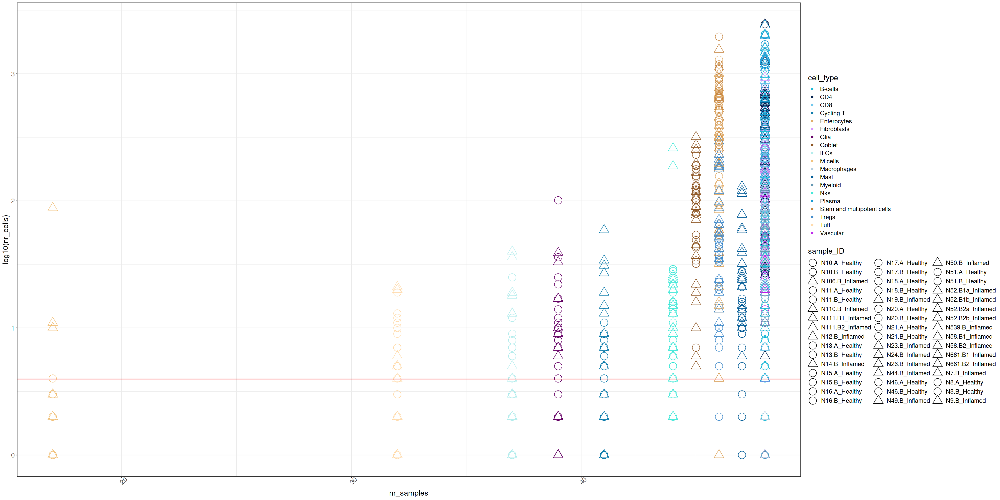

In [49]:
options(repr.plot.width=30, repr.plot.height=15) # Adjust the plot size if needed
ggplot(data = df, aes(x=nr_samples, y=log10(nr_cells), color=cell_type, shape=sample_ID, size = sample_ID)) +
    geom_point() +
    scale_color_manual(values=color_celltype) +
    scale_shape_manual(values=shape_sample) +
    scale_size_manual(values=size_sample + 4) +
    geom_hline(yintercept = log10(threshold_celltype_size) - 0.1, color = "red") +
    theme_bw() +
    theme(
        text = element_text(family = "Helvetica", size = 16),  # Set Helvetica font and size
        axis.text.x = element_text(size = 14, angle = 45),  # Compress and rotate X-axis text
        axis.text.y = element_text(size = 14),
        axis.title.x = element_text(size = 16),
        axis.title.y = element_text(size = 16)
    )


In [50]:
# apply celltype size filter
# filter cell annotation file
anno_cells_cf_ctf <- anno_cells_cf[anno_cells_cf$celltype_size_filter,]
print("number of cells before celltype size filtering:")
print(nrow(anno_cells_cf))
print("number of cells after celltype size filtering:")
print(nrow(anno_cells_cf_ctf))

[1] "number of cells before celltype size filtering:"
[1] 160707
[1] "number of cells after celltype size filtering:"
[1] 160482


In [51]:
# filler count matrix
str(counts_cf)
counts_cf_ctf <- counts_cf[,anno_cells_cf$celltype_size_filter]
str(counts_cf_ctf)
rm(counts_cf)

Formal class 'dgCMatrix' [package "Matrix"] with 6 slots
  ..@ i       : int [1:195615125] 15 46 72 77 89 631 715 742 745 755 ...
  ..@ p       : int [1:160708] 0 1119 2653 4695 7361 10651 12424 13627 16104 19225 ...
  ..@ Dim     : int [1:2] 21784 160707
  ..@ Dimnames:List of 2
  .. ..$ : chr [1:21784] "7SK" "A1BG" "A1BG-AS1" "A1CF" ...
  .. ..$ : chr [1:160707] "N10.EpiA.AACATTGAAAGTAG" "N10.EpiA.AACCCAGACGTAAC" "N10.EpiA.AATCTCACCGCATA" "N10.EpiA.ACAATAACCGCTAA" ...
  ..@ x       : num [1:195615125] 2 1 1 1 1 1 3 2 2 1 ...
  ..@ factors : list()
Formal class 'dgCMatrix' [package "Matrix"] with 6 slots
  ..@ i       : int [1:195335322] 15 46 72 77 89 631 715 742 745 755 ...
  ..@ p       : int [1:160483] 0 1119 2653 4695 7361 10651 12424 13627 16104 19225 ...
  ..@ Dim     : int [1:2] 21784 160482
  ..@ Dimnames:List of 2
  .. ..$ : chr [1:21784] "7SK" "A1BG" "A1BG-AS1" "A1CF" ...
  .. ..$ : chr [1:160482] "N10.EpiA.AACATTGAAAGTAG" "N10.EpiA.AACCCAGACGTAAC" "N10.EpiA.AATCTCACCGCATA"

In [52]:
print("following cell types didn't pass the celltype size filter:")
for(sample in unique(anno_cells_cf_ctf$sample_ID)){
        print(sample)
        my_anno_cf <- anno_cells_cf[anno_cells_cf$sample_ID == sample,]
        print(table(my_anno_cf[!my_anno_cf$celltype_size_filter,"cell_type"]))
}

[1] "following cell types didn't pass the celltype size filter:"
[1] "N10.A_Healthy"

M cells 
      1 
[1] "N10.B_Healthy"

   ILCs M cells 
      3       2 
[1] "N8.A_Healthy"

Cycling T      ILCs   M cells      Mast       Nks      Tuft 
        1         1         1         2         4         2 
[1] "N8.B_Healthy"

  B-cells Cycling T      ILCs      Tuft 
        4         1         1         1 
[1] "N11.A_Healthy"

    B-cells   Cycling T        Glia Macrophages        Mast         Nks 
          2           3           4           2           3           2 
      Tregs 
          2 
[1] "N11.B_Healthy"

Cycling T      ILCs 
        4         1 
[1] "N13.A_Healthy"

 CD4 Mast 
   1    1 
[1] "N13.B_Healthy"

      CD4       CD8 Cycling T 
        1         1         1 
[1] "N15.A_Healthy"

M cells    Tuft 
      3       3 
[1] "N15.B_Healthy"

Glia ILCs 
   3    3 
[1] "N16.A_Healthy"

   ILCs M cells 
      2       2 
[1] "N16.B_Healthy"

Tuft 
   3 
[1] "N17.A_Healthy"

ILCs 
  

In [53]:
print(unique(anno_cells_cf_ctf$sample_ID[idx_celltype]))

 [1] "N15.A_Healthy"    "N15.B_Healthy"    "N16.A_Healthy"    "N16.B_Healthy"   
 [5] "N17.B_Healthy"    "N17.A_Healthy"    "N18.A_Healthy"    "N18.B_Healthy"   
 [9] "N20.B_Healthy"    "N20.A_Healthy"    "N21.A_Healthy"    "N21.B_Healthy"   
[13] "N51.A_Healthy"    "N51.B_Healthy"    "N46.A_Healthy"    "N46.B_Healthy"   
[17] "N10.A_Healthy"    "N10.B_Healthy"    "N11.B_Healthy"    "N13.A_Healthy"   
[21] "N13.B_Healthy"    "N7.B_Inflamed"    "N9.B_Inflamed"    "N12.B_Inflamed"  
[25] "N14.B_Inflamed"   "N19.B_Inflamed"   "N23.B_Inflamed"   "N24.B_Inflamed"  
[29] "N26.B_Inflamed"   "N52.B1a_Inflamed" "N52.B2a_Inflamed" "N52.B1b_Inflamed"
[33] "N52.B2b_Inflamed" "N58.B1_Inflamed"  "N111.B1_Inflamed" "N111.B2_Inflamed"
[37] "N661.B1_Inflamed" "N661.B2_Inflamed" "N44.B_Inflamed"   "N49.B_Inflamed"  
[41] "N50.B_Inflamed"   "N106.B_Inflamed"  "N539.B_Inflamed"  "N110.B_Inflamed" 
[45] NA                


In [54]:
print(unique(anno_cells_cf_ctf$sample_ID))

 [1] "N10.A_Healthy"    "N10.B_Healthy"    "N8.A_Healthy"     "N8.B_Healthy"    
 [5] "N11.A_Healthy"    "N11.B_Healthy"    "N13.A_Healthy"    "N13.B_Healthy"   
 [9] "N15.A_Healthy"    "N15.B_Healthy"    "N16.A_Healthy"    "N16.B_Healthy"   
[13] "N17.A_Healthy"    "N17.B_Healthy"    "N18.A_Healthy"    "N18.B_Healthy"   
[17] "N20.A_Healthy"    "N20.B_Healthy"    "N21.A_Healthy"    "N21.B_Healthy"   
[21] "N51.A_Healthy"    "N51.B_Healthy"    "N46.A_Healthy"    "N46.B_Healthy"   
[25] "N7.B_Inflamed"    "N9.B_Inflamed"    "N12.B_Inflamed"   "N14.B_Inflamed"  
[29] "N19.B_Inflamed"   "N23.B_Inflamed"   "N24.B_Inflamed"   "N26.B_Inflamed"  
[33] "N52.B1a_Inflamed" "N52.B2a_Inflamed" "N52.B1b_Inflamed" "N52.B2b_Inflamed"
[37] "N58.B1_Inflamed"  "N111.B1_Inflamed" "N111.B2_Inflamed" "N44.B_Inflamed"  
[41] "N49.B_Inflamed"   "N50.B_Inflamed"   "N106.B_Inflamed"  "N539.B_Inflamed" 
[45] "N110.B_Inflamed"  "N661.B1_Inflamed" "N661.B2_Inflamed" "N58.B2_Inflamed" 


### filter for being present in min number of samples

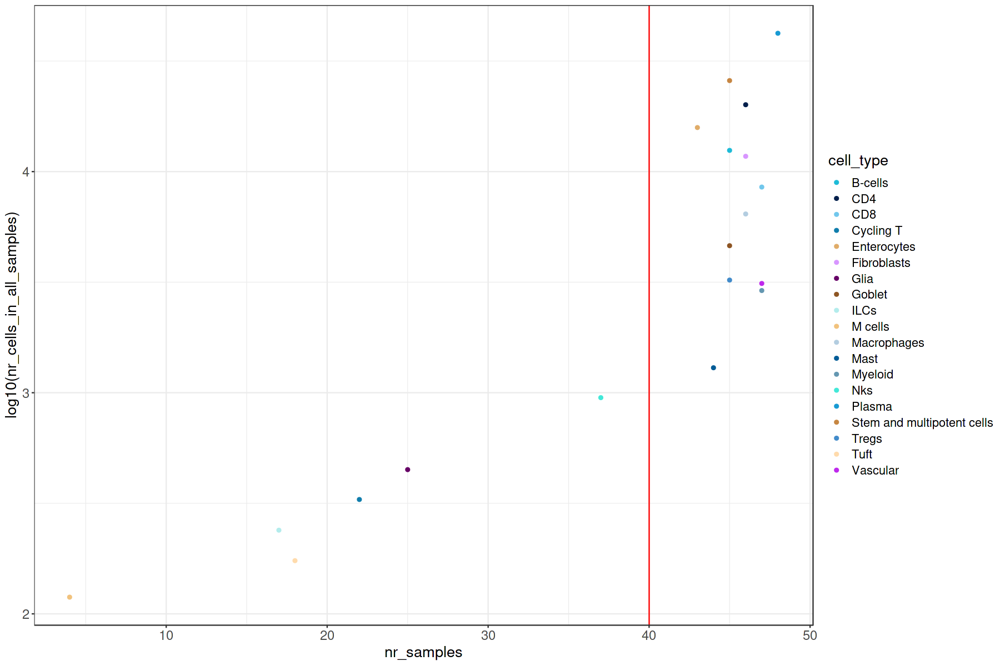

In [55]:
options(repr.plot.width=15,repr.plot.height=10)
# visualize nr_samples vs log10_nr_cells_all_samples before filtering, different colors
options(repr.plot.width=15,repr.plot.height=10)
df <-unique(data.frame(cell_type = anno_cells_cf_ctf$cell_type))

df$nr_cells_in_all_samples <- sapply(1: nrow(df)
                      ,function(i){
                              my_celltype <- df$cell_type[i]
                              nr_cells <- sum(anno_cells_cf_ctf$cell_type == my_celltype)
                              nr_cells
                      })

df$nr_samples <- sapply(1: nrow(df)
                        ,function(i){
                                my_celltype <- df$cell_type[i]
                                idx_celltype <- anno_cells_cf_ctf$cell_type == my_celltype
                                nr_samples <- length(unique(anno_cells_cf_ctf$sample_ID[idx_celltype]))
                                nr_samples
                        })

rownames(df) <- df$cell_type

ggplot(data = df, aes(x = nr_samples, y = log10(nr_cells_in_all_samples), color = cell_type)) +
    geom_point() +
    scale_color_manual(values = color_celltype) +
    geom_vline(xintercept = threshold_nr_samples, color = "red") +
    theme_bw() +
    theme(
        text = element_text(family = "Helvetica", size = 16),  # Set Helvetica font and size
        axis.text.x = element_text(size = 14),  # Keep X-axis text size the same
        axis.text.y = element_text(size = 14),
        axis.title.x = element_text(size = 16),
        axis.title.y = element_text(size = 16))

# Filter underrepresented cell types

In [56]:
print(paste("filter out celltypes present in less than"
             ,threshold_nr_samples
             ,"samples"))
print("following celltypes didn' pass the filter")
bad_celltypes <- rownames(df)[df$nr_samples < threshold_nr_samples]
print(bad_celltypes)

[1] "filter out celltypes present in less than 40 samples"
[1] "following celltypes didn' pass the filter"
[1] "Tuft"      "Glia"      "Nks"       "ILCs"      "Cycling T" "M cells"  


In [57]:
str(counts_cf_ctf)
print("dim(counts_cf_ctf) before filtering")
print(dim(counts_cf_ctf))
counts_cf_ctf <- counts_cf_ctf[,!(anno_cells_cf_ctf$cell_type %in% bad_celltypes)]
print("dim(counts_cf_ctf) after filtering")
print(dim(counts_cf_ctf))
print("dim(anno_cells_cf_ctf) before filtering")
print(dim(anno_cells_cf_ctf))
anno_cells_cf_ctf <- anno_cells_cf_ctf[!(anno_cells_cf_ctf$cell_type %in% bad_celltypes),]
print("dim(anno_cells_cf_ctf) after filtering")
print(dim(anno_cells_cf_ctf))

Formal class 'dgCMatrix' [package "Matrix"] with 6 slots
  ..@ i       : int [1:195335322] 15 46 72 77 89 631 715 742 745 755 ...
  ..@ p       : int [1:160483] 0 1119 2653 4695 7361 10651 12424 13627 16104 19225 ...
  ..@ Dim     : int [1:2] 21784 160482
  ..@ Dimnames:List of 2
  .. ..$ : chr [1:21784] "7SK" "A1BG" "A1BG-AS1" "A1CF" ...
  .. ..$ : chr [1:160482] "N10.EpiA.AACATTGAAAGTAG" "N10.EpiA.AACCCAGACGTAAC" "N10.EpiA.AATCTCACCGCATA" "N10.EpiA.ACAATAACCGCTAA" ...
  ..@ x       : num [1:195335322] 2 1 1 1 1 1 3 2 2 1 ...
  ..@ factors : list()
[1] "dim(counts_cf_ctf) before filtering"
[1]  21784 160482
[1] "dim(counts_cf_ctf) after filtering"
[1]  21784 158222
[1] "dim(anno_cells_cf_ctf) before filtering"
[1] 160482     19
[1] "dim(anno_cells_cf_ctf) after filtering"
[1] 158222     19


In [58]:
str(counts_cf_ctf)

Formal class 'dgCMatrix' [package "Matrix"] with 6 slots
  ..@ i       : int [1:192880714] 15 46 72 77 89 631 715 742 745 755 ...
  ..@ p       : int [1:158223] 0 1119 2653 4695 7361 10651 12424 13627 16104 19225 ...
  ..@ Dim     : int [1:2] 21784 158222
  ..@ Dimnames:List of 2
  .. ..$ : chr [1:21784] "7SK" "A1BG" "A1BG-AS1" "A1CF" ...
  .. ..$ : chr [1:158222] "N10.EpiA.AACATTGAAAGTAG" "N10.EpiA.AACCCAGACGTAAC" "N10.EpiA.AATCTCACCGCATA" "N10.EpiA.ACAATAACCGCTAA" ...
  ..@ x       : num [1:192880714] 2 1 1 1 1 1 3 2 2 1 ...
  ..@ factors : list()


In [59]:
# visualize expression after cell filtering and celltype size filtering
print("visualize expression after cell filtering and celltype size filtering")
df <- data.frame(log10_lib_size = log10(anno_cells_cf_ctf$total_counts_raw +1)
                 ,sample_ID = anno_cells_cf_ctf$sample_ID
)
df$sample_ID <- factor(df$sample_ID, levels = unique(df$sample_ID))
print(str(df))

[1] "visualize expression after cell filtering and celltype size filtering"
'data.frame':	158222 obs. of  2 variables:
 $ log10_lib_size: num  3.48 3.81 3.97 4.13 4.33 ...
 $ sample_ID     : Factor w/ 48 levels "N10.A_Healthy",..: 1 1 1 1 1 1 1 1 1 1 ...
NULL


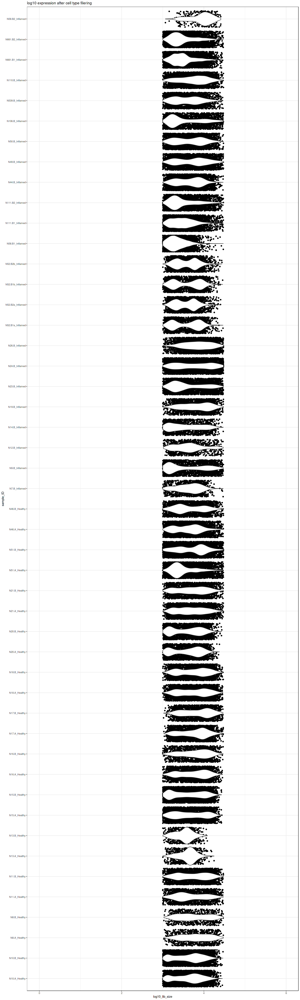

In [60]:
options(repr.plot.width=15,repr.plot.height=50)
ggplot(data = df
             ,aes(x = sample_ID
                  ,y = log10_lib_size
             )
) +
        geom_jitter(height = NULL) +
        geom_violin() + 
        ggtitle("log10 expression after cell type filering") +
        coord_flip() +
        ylim(c(0,6))+
        theme_bw()

rm(df)

In [61]:
# create anno_samples_cf_ctf
anno_samples_cf_ctf <- anno_samples_cf

In [62]:
# save cell number in anno_samples
for(sample in unique(anno_cells_cf_ctf$sample_ID)){
        
        my_anno_cf <- anno_cells_cf_ctf[anno_cells_cf_ctf$sample_ID == sample,]
        
        anno_samples_cf_ctf$nr_cells_cf_ctf[anno_samples_cf_ctf$sample_ID == sample] <- nrow(my_anno_cf)
}
print("anno_samples_cf_ctf")
print(anno_samples_cf_ctf)

[1] "anno_samples_cf_ctf"
          sample_ID patient_ID   region case_or_control health_status
1     N10.A_Healthy        N10  Healthy         control       Healthy
2     N10.B_Healthy        N10  Healthy         control       Healthy
3      N8.A_Healthy         N8  Healthy         control       Healthy
4      N8.B_Healthy         N8  Healthy         control       Healthy
5     N11.A_Healthy        N11  Healthy         control       Healthy
6     N11.B_Healthy        N11  Healthy         control       Healthy
7     N13.A_Healthy        N13  Healthy         control       Healthy
8     N13.B_Healthy        N13  Healthy         control       Healthy
9     N15.A_Healthy        N15  Healthy         control       Healthy
10    N15.B_Healthy        N15  Healthy         control       Healthy
11    N16.A_Healthy        N16  Healthy         control       Healthy
12    N16.B_Healthy        N16  Healthy         control       Healthy
13    N17.A_Healthy        N17  Healthy         control       He

In [63]:
# create anno_gene_cf_ctf
anno_genes_cf_ctf <- anno_genes_cf

In [64]:
str(counts_cf_ctf)

Formal class 'dgCMatrix' [package "Matrix"] with 6 slots
  ..@ i       : int [1:192880714] 15 46 72 77 89 631 715 742 745 755 ...
  ..@ p       : int [1:158223] 0 1119 2653 4695 7361 10651 12424 13627 16104 19225 ...
  ..@ Dim     : int [1:2] 21784 158222
  ..@ Dimnames:List of 2
  .. ..$ : chr [1:21784] "7SK" "A1BG" "A1BG-AS1" "A1CF" ...
  .. ..$ : chr [1:158222] "N10.EpiA.AACATTGAAAGTAG" "N10.EpiA.AACCCAGACGTAAC" "N10.EpiA.AATCTCACCGCATA" "N10.EpiA.ACAATAACCGCTAA" ...
  ..@ x       : num [1:192880714] 2 1 1 1 1 1 3 2 2 1 ...
  ..@ factors : list()


### export

In [65]:
# #save counts_cf_ctf.RData
# save(counts_cf_ctf, file = "counts_cf_ctf.RData")

# #save anno_cells_cf_ctf.RData
# save(anno_cells_cf_ctf, file = "anno_cells_cf_ctf.RData")

# #save anno_samples_cf_ctf.RData
# save(anno_samples_cf_ctf, file = "anno_samples_cf_ctf.RData")

# #save anno_genes_cf_ctf.RData
# save(anno_genes_cf_ctf, file = "anno_genes_cf_ctf.RData")

## Filter genes

Individual genes might be specific to certain cell types in cetrain health conditions. Here we will construct pseudo-bulk cell types (per sample) and filter out genes that have too low cumulative expression in these pseudo-bulks.

- **INPUT:**
    - ```counts_cf_ctf.RData``` 
    - ```anno_cells_cf_ctf.RData```
    - ```anno_samples_cf_ctf.RData```
    - ```anno_genes_cf_ctf.RData```
    - ```cell_relabelling.csv``` file containing unified cell type annotations. Stored in additional_input_files sub-directory.
    
    
- **NOTES:**

    The '_gf' ending in the file names stands for gene filter.
    
    
- **OUTPUT:**

    -  ```counts_cf_ctf_gf.RData```
    -  ```anno_cells_cf_ctf_gf.RData```
    -  ```anno_samples_cf_ctf_gf.RData```
    -  ```anno_genes_cf_ctf_gf.RData```

In [66]:
rownames(cell_relabelling) <- cell_relabelling$cell_type_original
print(str(cell_relabelling))

'data.frame':	51 obs. of  6 variables:
 $ cell_type_original      : chr  "Stem" "TA 1" "TA 2" "Cycling TA" ...
 $ tissue_type             : chr  "Epithelial" "Epithelial" "Epithelial" "Epithelial" ...
 $ cell_type_original_color: chr  "#CB4335" "#CB4335" "#CB4335" "#CB4335" ...
 $ cell_type_color         : chr  "#c68642" "#c68642" "#c68642" "#c68642" ...
 $ population_shape        : int  19 19 19 19 19 19 19 19 19 19 ...
 $ cell_type               : chr  "Stem and multipotent cells" "Stem and multipotent cells" "Stem and multipotent cells" "Stem and multipotent cells" ...
NULL


In [67]:
# thresholds
threshold_sum_pseudobulkCellType_expr <- 3
print(paste("threshold_sum_pseudobulkCellType_expr: >", threshold_sum_pseudobulkCellType_expr))


[1] "threshold_sum_pseudobulkCellType_expr: > 3"


In [68]:
# color scheme for celltypes
color_celltype <- cell_relabelling$cell_type_color[!duplicated(cell_relabelling$cell_type)]
names(color_celltype) <- cell_relabelling$cell_type[!duplicated(cell_relabelling$cell_type)]

### process data

In [69]:
# construct pseudo sorted bulk

anno_cells_cf_ctf$cell_type_ID <- paste(anno_cells_cf_ctf$cell_type
                                        ,anno_cells_cf_ctf$sample_ID
                                        ,sep = "_"
)

In [70]:
cell_type_IDs <- unique(anno_cells_cf_ctf$cell_type_ID)
counts_raw_pseudobulkCellType <- as.data.frame(matrix(,nrow = nrow(counts_cf_ctf)
                                                    ,ncol = length(cell_type_IDs)
))

i <- 1
for(cell_type_ID in cell_type_IDs){
        #print(cell_type_ID)
        
        idx_cell_type_ID <- anno_cells_cf_ctf$cell_type_ID == cell_type_ID
        
        if(sum(idx_cell_type_ID) == 0){
                counts_raw_pseudobulkCellType[,i] <- 0
        } else if( sum(idx_cell_type_ID) == 1){
                counts_raw_pseudobulkCellType[,i] <- counts_cf_ctf[,idx_cell_type_ID]
        } else {
                counts_raw_pseudobulkCellType[,i] <- rowMeans(counts_cf_ctf[,idx_cell_type_ID])
        }
        
        i <- i+1
}

colnames(counts_raw_pseudobulkCellType) <- cell_type_IDs
rownames(counts_raw_pseudobulkCellType) <- rownames(counts_cf_ctf)
cat("str(counts_raw_pseudobulkCellType\n\n)")

str(counts_raw_pseudobulkCellType

)

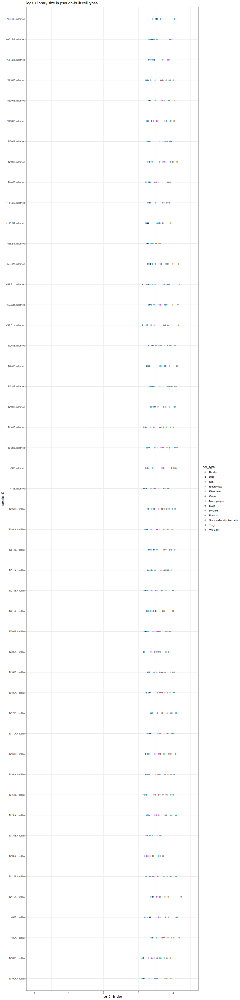

In [71]:
# visualize expression in pseudo sorted bulk
options(repr.plot.width=12, repr.plot.height=50) # plot margins

#my_sampes <- sub("_.*", "", colnames(counts_raw_pseudobulkCellType))
my_sampes <- sub("_.*", "", colnames(counts_raw_pseudobulkCellType))
df <- data.frame(log10_lib_size = log10(colSums(counts_raw_pseudobulkCellType) +1),
                 sample_ID = sub("_", ".", sub("^[^_]+_", "", colnames(counts_raw_pseudobulkCellType))),
                 cell_type = sub("_.*", "", colnames(counts_raw_pseudobulkCellType)))
df$sample_ID <- factor(df$sample_ID, levels = unique(df$sample_ID))

ggplot(data = df
             ,aes(x = sample_ID
                  ,y = log10_lib_size
                  ,color = cell_type
             )
) +
        #geom_violin() + 
        geom_jitter(height = NULL
                    ,width = 0
                    ,alpha = 0.75) +
        ggtitle("log10 library size in pseudo-bulk cell types") +
        coord_flip() +
        ylim(c(0,4.5)) +
        scale_color_manual(values = color_celltype)+
        theme_bw()

### visualize possible filtering parameters

In [72]:
nr_expressing_cell_types <- rowSums(counts_raw_pseudobulkCellType != 0)

anno_genes_cf_ctf$sum_pseudobulkCellType_expr = rowSums(as.matrix(counts_raw_pseudobulkCellType))
anno_genes_cf_ctf$sum_pseudobulkCellType_expr_threshold <- rep(threshold_sum_pseudobulkCellType_expr, nrow(anno_genes_cf_ctf))
anno_genes_cf_ctf$sum_pseudobulkCellType_expr_filter <- anno_genes_cf_ctf$sum_pseudobulkCellType_expr > threshold_sum_pseudobulkCellType_expr
print(str(anno_genes_cf_ctf))

'data.frame':	21784 obs. of  7 variables:
 $ gene_symbol                          : chr  "7SK" "A1BG" "A1BG-AS1" "A1CF" ...
 $ inDB                                 : logi  FALSE TRUE FALSE FALSE TRUE FALSE ...
 $ isLigand                             : logi  FALSE FALSE FALSE FALSE TRUE FALSE ...
 $ isReceptor                           : logi  FALSE TRUE FALSE FALSE FALSE FALSE ...
 $ sum_pseudobulkCellType_expr          : num  2.55 1.28 7.38 24.51 440.93 ...
 $ sum_pseudobulkCellType_expr_threshold: num  3 3 3 3 3 3 3 3 3 3 ...
 $ sum_pseudobulkCellType_expr_filter   : logi  FALSE FALSE TRUE TRUE TRUE FALSE ...
NULL


In [73]:
print(paste("we have"
            ,nrow(counts_cf_ctf)
            ,"genes before filtering"
)
)
print(paste("we have"
            ,sum(anno_genes_cf_ctf$sum_pseudobulkCellType_expr_filter)
            ,"genes after filtering"
)
)

[1] "we have 21784 genes before filtering"
[1] "we have 13861 genes after filtering"


In [74]:
str(counts_cf_ctf)

Formal class 'dgCMatrix' [package "Matrix"] with 6 slots
  ..@ i       : int [1:192880714] 15 46 72 77 89 631 715 742 745 755 ...
  ..@ p       : int [1:158223] 0 1119 2653 4695 7361 10651 12424 13627 16104 19225 ...
  ..@ Dim     : int [1:2] 21784 158222
  ..@ Dimnames:List of 2
  .. ..$ : chr [1:21784] "7SK" "A1BG" "A1BG-AS1" "A1CF" ...
  .. ..$ : chr [1:158222] "N10.EpiA.AACATTGAAAGTAG" "N10.EpiA.AACCCAGACGTAAC" "N10.EpiA.AATCTCACCGCATA" "N10.EpiA.ACAATAACCGCTAA" ...
  ..@ x       : num [1:192880714] 2 1 1 1 1 1 3 2 2 1 ...
  ..@ factors : list()


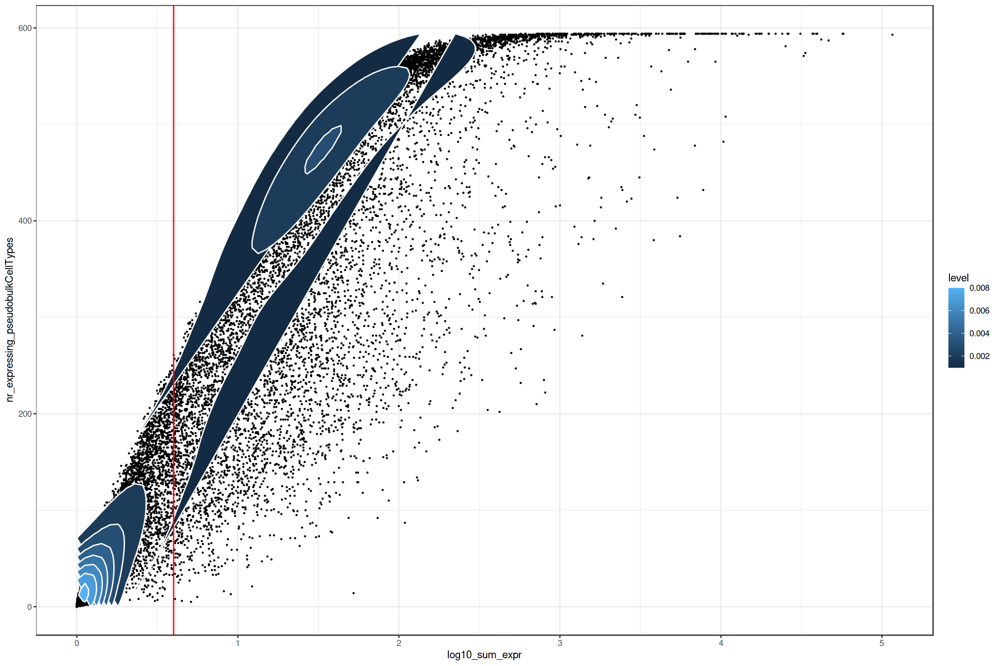

In [75]:
options(repr.plot.width=15,repr.plot.height=10)
# plot sum expression vs nr expressing pseudobulk cell types
df <- data.frame(log10_sum_expr = log10(rowSums(as.matrix(counts_raw_pseudobulkCellType)) +1)
                 ,nr_expressing_pseudobulkCellTypes = nr_expressing_cell_types
                 ,passed_gene_filter = anno_genes_cf_ctf$sum_pseudobulkCellType_expr_filter
)

ggplot(data = df
             ,aes(x = log10_sum_expr
                  ,y = nr_expressing_pseudobulkCellTypes
             )
) +
        geom_point(size = 0.05)+
        stat_density_2d(aes(fill = ..level..), geom = "polygon", colour="white") +
        geom_vline(xintercept = log10(threshold_sum_pseudobulkCellType_expr+1), color = "red")+
        theme_bw()

### filter genes

In [76]:
# filter genes by gene filter from the gene annotation file
counts_cf_ctf_gf <- counts_cf_ctf[anno_genes_cf_ctf$sum_pseudobulkCellType_expr_filter,]
print(dim(counts_cf_ctf_gf))
str(counts_cf_ctf_gf)

[1]  13861 158222
Formal class 'dgCMatrix' [package "Matrix"] with 6 slots
  ..@ i       : int [1:191284859] 9 29 48 52 64 181 212 234 236 245 ...
  ..@ p       : int [1:158223] 0 1112 2626 4649 7295 10552 12313 13505 15960 19031 ...
  ..@ Dim     : int [1:2] 13861 158222
  ..@ Dimnames:List of 2
  .. ..$ : chr [1:13861] "A1BG-AS1" "A1CF" "A2M" "A4GALT" ...
  .. ..$ : chr [1:158222] "N10.EpiA.AACATTGAAAGTAG" "N10.EpiA.AACCCAGACGTAAC" "N10.EpiA.AATCTCACCGCATA" "N10.EpiA.ACAATAACCGCTAA" ...
  ..@ x       : num [1:191284859] 2 1 1 1 1 1 3 2 2 1 ...
  ..@ factors : list()


In [77]:
# filter gene annotation by gene filter from the gene annotation file
anno_genes_cf_ctf_gf <- anno_genes_cf_ctf[anno_genes_cf_ctf$sum_pseudobulkCellType_expr_filter,]

In [78]:
# store total counts per cell after gene filtering in the cell annotation file
anno_cells_cf_ctf_gf <- anno_cells_cf_ctf
anno_cells_cf_ctf_gf$total_counts_raw_cf_ctf_gf <- colSums(counts_cf_ctf_gf)

In [79]:
anno_samples_cf_ctf_gf <- anno_samples_cf_ctf

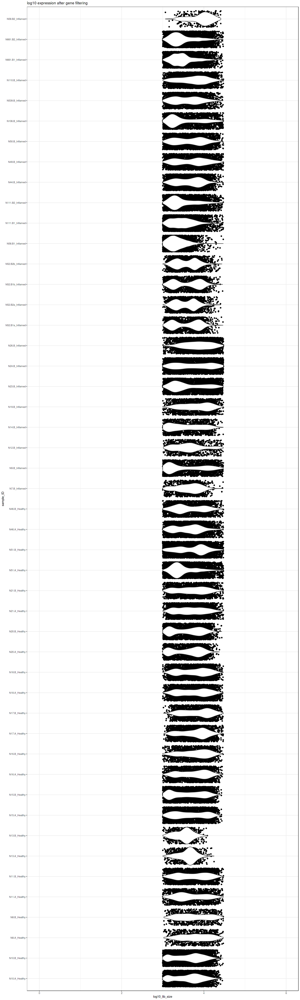

In [80]:
# visualize the expression after gene filter
options(repr.plot.width=15,repr.plot.height=50)
df <- data.frame(log10_lib_size = log10(anno_cells_cf_ctf_gf$total_counts_raw_cf_ctf_gf +1)
                 ,sample_ID = anno_cells_cf_ctf_gf$sample_ID
)
df$sample_ID <- factor(df$sample_ID, levels = unique(df$sample_ID))

ggplot(data = df
             ,aes(x = sample_ID
                  ,y = log10_lib_size
             )
) +
        geom_jitter(height = NULL) +
        geom_violin() + 
        ggtitle("log10 expression after gene filtering") +
        coord_flip() +
        ylim(c(0,6))+
        theme_bw()

rm(df)

### export

## Filter samples

Samples with less than 7 cell types will be filtered out.

- **INPUT:**
    - ```counts_cf_ctf_gf.RData``` 
    - ```anno_cells_cf_ctf_gf.RData```
    - ```anno_samples_cf_ctf_gf.RData```
    - ```anno_genes_cf_ctf_gf.RData```
    
- **NOTES:**

    The '_sf' ending in the file names stands for sample filter.
    
- **OUTPUT:**

    -  ```counts_cf_ctf_gf_sf.RData``` 
    -  ```anno_cells_cf_ctf_gf_sf.RData``` 
    -  ```anno_samples_cf_ctf_gf_sf.RData```
    -  ```anno_genes_cf_ctf_gf_sf.RData```

In [81]:
# thresholds ####
threshold_nr_celltypes <- (length(unique(anno_cells_cf_ctf_gf$cell_type))-1)
print(paste("A sample should contain at least"
            ,threshold_nr_celltypes
            ,"cell types"))

[1] "A sample should contain at least 12 cell types"


### filter

In [82]:
# filter out samples that are not present in the cell annotation
print(dim(anno_samples_cf_ctf_gf))
anno_samples_cf_ctf_gf <- anno_samples_cf_ctf_gf[anno_samples_cf_ctf_gf$sample_ID %in% unique(anno_cells_cf_ctf_gf$sample_ID),]

[1] 48  8


In [83]:
rownames(anno_samples_cf_ctf_gf) <- anno_samples_cf_ctf_gf$sample_ID
anno_samples_cf_ctf_gf <- anno_samples_cf_ctf_gf[unique(anno_cells_cf_ctf_gf$sample_ID),]
print(dim(anno_samples_cf_ctf_gf))

[1] 48  8


In [84]:
# store total counts per sample after gene filtering in the sample annotation file
anno_samples_cf_ctf_gf$total_counts_raw_cf_ctf_gf <- sapply(unique(anno_cells_cf_ctf_gf$sample_ID)
                                                         ,function(sample){
                                                             #print(sample)
                                                                 idx_sample <- anno_cells_cf_ctf_gf$sample_ID == sample
                                                             #print(sum(idx_sample))
                                                                 sum(anno_cells_cf_ctf_gf$total_counts_raw_cf_ctf_gf[idx_sample])
                                                         })

In [85]:
# store number of cell types per sample after gene filtering in the sample annotation file
anno_samples_cf_ctf_gf$nr_celltypes_cf_ctf_gf <- sapply(anno_samples_cf_ctf_gf$sample_ID
                                                         ,function(sample){
                                                                 idx_sample <- anno_cells_cf_ctf_gf$sample_ID == sample
                                                                 length(unique(anno_cells_cf_ctf_gf$cell_type[idx_sample]))
                                                         })

In [86]:
anno_samples_cf_ctf_gf$threshold_nr_celltypes <- paste("greater or equal"
                                              ,threshold_nr_celltypes)
anno_samples_cf_ctf_gf$passed_threshold_nr_celltypes <- anno_samples_cf_ctf_gf$nr_celltypes_cf_ctf_gf >= threshold_nr_celltypes


In [87]:
print(paste("we have"
            ,sum(anno_samples_cf_ctf_gf$passed_threshold_nr_celltypes)
            ,"samples that passed the threshold"))
print(paste("we have"
            ,sum(!anno_samples_cf_ctf_gf$passed_threshold_nr_celltypes)
            ,"samples that didn't pass the threshold:"))

[1] "we have 42 samples that passed the threshold"
[1] "we have 6 samples that didn't pass the threshold:"


In [88]:
bad_samples <- anno_samples_cf_ctf_gf$sample_ID[!anno_samples_cf_ctf_gf$passed_threshold_nr_celltypes]
print(bad_samples)

[1] "N11.A_Healthy"    "N13.A_Healthy"    "N13.B_Healthy"    "N661.B1_Inflamed"
[5] "N661.B2_Inflamed" "N58.B2_Inflamed" 


### visualization

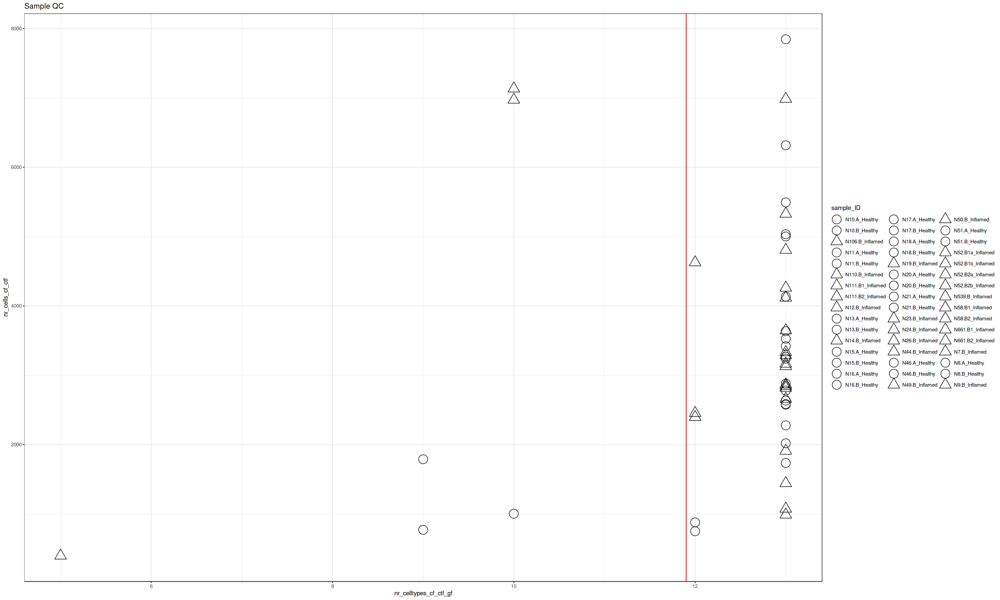

In [89]:
options(repr.plot.width=25,repr.plot.height=15)
ggplot(data = anno_samples_cf_ctf_gf
       ,aes(x = nr_celltypes_cf_ctf_gf
            ,y = nr_cells_cf_ctf
            #,color = sample_ID
            ,shape = sample_ID
            ,size = sample_ID
       )
) +
        geom_point()+
        ggtitle("Sample QC") +
        geom_vline(xintercept = threshold_nr_celltypes- 0.1
                   ,color = "red")+
        scale_shape_manual(values=shape_sample)+
        scale_size_manual(values=size_sample+4)+
        theme_bw()

In [90]:
#subset anno_anno_samples_cf_ctf_gf

print("dim(anno_samples_cf_ctf_gf) before filtering")
print(dim(anno_samples_cf_ctf_gf))
anno_samples_cf_ctf_gf_sf <- anno_samples_cf_ctf_gf[anno_samples_cf_ctf_gf$passed_threshold_nr_celltypes,]
print("dim(anno_samples_cf_ctf_gf_sf) after filtering")
print(dim(anno_samples_cf_ctf_gf_sf))

[1] "dim(anno_samples_cf_ctf_gf) before filtering"
[1] 48 12
[1] "dim(anno_samples_cf_ctf_gf_sf) after filtering"
[1] 42 12


In [91]:
#subset anno_cells

print("dim(anno_cells_cf_ctf_gf) before filtering")
print(dim(anno_cells_cf_ctf_gf))
idx_bad <- anno_cells_cf_ctf_gf$sample_ID %in% bad_samples
anno_cells_cf_ctf_gf_sf <- anno_cells_cf_ctf_gf[!idx_bad,]
print("dim(anno_cells_cf_ctf_gf_sf) after filtering")
print(dim(anno_cells_cf_ctf_gf_sf))

[1] "dim(anno_cells_cf_ctf_gf) before filtering"
[1] 158222     21
[1] "dim(anno_cells_cf_ctf_gf_sf) after filtering"
[1] 140156     21


In [92]:
#subset counts_cf_ctf_gf

print("dim(counts_cf_ctf_gf) before filtering")
print(dim(counts_cf_ctf_gf))
str(counts_cf_ctf_gf)
counts_cf_ctf_gf_sf <- counts_cf_ctf_gf[,!idx_bad]
print("dim(counts_cf_ctf_gf_sf) after filtering")
print(dim(counts_cf_ctf_gf_sf))

[1] "dim(counts_cf_ctf_gf) before filtering"
[1]  13861 158222
Formal class 'dgCMatrix' [package "Matrix"] with 6 slots
  ..@ i       : int [1:191284859] 9 29 48 52 64 181 212 234 236 245 ...
  ..@ p       : int [1:158223] 0 1112 2626 4649 7295 10552 12313 13505 15960 19031 ...
  ..@ Dim     : int [1:2] 13861 158222
  ..@ Dimnames:List of 2
  .. ..$ : chr [1:13861] "A1BG-AS1" "A1CF" "A2M" "A4GALT" ...
  .. ..$ : chr [1:158222] "N10.EpiA.AACATTGAAAGTAG" "N10.EpiA.AACCCAGACGTAAC" "N10.EpiA.AATCTCACCGCATA" "N10.EpiA.ACAATAACCGCTAA" ...
  ..@ x       : num [1:191284859] 2 1 1 1 1 1 3 2 2 1 ...
  ..@ factors : list()
[1] "dim(counts_cf_ctf_gf_sf) after filtering"
[1]  13861 140156


In [93]:
anno_cells_cf_ctf_gf_sf$total_counts_raw_cf_ctf_gf_sf <- colSums(counts_cf_ctf_gf_sf)

anno_genes_cf_ctf_gf_sf <- anno_genes_cf_ctf_gf

# Additional Filtering Steps

In [94]:
region_counts <- anno_samples_cf_ctf_gf_sf %>%
  group_by(region) %>%
  count()

print(region_counts)

# A tibble: 2 × 2
# Groups:   region [2]
  region       n
  <chr>    <int>
1 Healthy     21
2 Inflamed    21


In [95]:
#exclude N51.A_Healthy due to irregularly high cell numbers
bad_samples <- anno_samples_cf_ctf_gf_sf$sample_ID[anno_samples_cf_ctf_gf_sf$sample_ID == "N51.A_Healthy"]

anno_samples_cf_ctf_gf_sf <- anno_samples_cf_ctf_gf_sf[!anno_samples_cf_ctf_gf_sf$sample_ID %in% bad_samples,]
anno_cells_cf_ctf_gf_sf <- anno_cells_cf_ctf_gf_sf[anno_cells_cf_ctf_gf_sf$sample_ID %in% anno_samples_cf_ctf_gf_sf$sample_ID,]
counts_cf_ctf_gf_sf <- counts_cf_ctf_gf_sf[,colnames(counts_cf_ctf_gf_sf) %in% anno_cells_cf_ctf_gf_sf$cell_ID]

In [96]:
# Filter data for Healthy region
filtered_healthy_data <- anno_samples_cf_ctf_gf_sf %>%
  filter(region == "Healthy") %>%
  group_by(patient_ID) %>%
  arrange(desc(nr_celltypes_cf_ctf_gf)) %>%
  slice_head(n = 1)

# Filter data for Non-inflamed region
filtered_non_inflamed_data <- anno_samples_cf_ctf_gf_sf %>%
  filter(region == "Non-inflamed") %>%
  group_by(patient_ID) %>%
  arrange(desc(nr_celltypes_cf_ctf_gf)) %>%
  slice_head(n = 1)

# Filter data for Inflamed region
filtered_inflamed_data <- anno_samples_cf_ctf_gf_sf %>%
  filter(region == "Inflamed") %>%
  group_by(patient_ID) %>%
  arrange(desc(nr_celltypes_cf_ctf_gf)) %>%
  slice_head(n = 1)

# Combine the filtered data
anno_samples_cf_ctf_gf_sf <- bind_rows(filtered_healthy_data, filtered_non_inflamed_data, filtered_inflamed_data)

# Set rownames
rownames(anno_samples_cf_ctf_gf_sf) <- anno_samples_cf_ctf_gf_sf$sample_ID


Warning message:
“Setting row names on a tibble is deprecated.”


In [97]:
anno_cells_cf_ctf_gf_sf <- anno_cells_cf_ctf_gf_sf[anno_cells_cf_ctf_gf_sf$sample_ID %in% rownames(anno_samples_cf_ctf_gf_sf),]
counts_cf_ctf_gf_sf <- counts_cf_ctf_gf_sf[,colnames(counts_cf_ctf_gf_sf) %in% anno_cells_cf_ctf_gf_sf$cell_ID ]

In [98]:
region_counts <- anno_samples_cf_ctf_gf_sf %>%
  group_by(region) %>%
  count()

print(region_counts)

# A tibble: 2 × 2
# Groups:   region [2]
  region       n
  <chr>    <int>
1 Healthy     11
2 Inflamed    17


In [99]:
# visualize expression after sample filter

df <- data.frame(log10_lib_size = log10(anno_cells_cf_ctf_gf_sf$total_counts_raw_cf_ctf_gf_sf +1)
                 ,sample_ID = anno_cells_cf_ctf_gf_sf$sample_ID
)
df$sample_ID <- factor(df$sample_ID, levels = unique(df$sample_ID))
print(str(df))

'data.frame':	93593 obs. of  2 variables:
 $ log10_lib_size: num  3.48 3.81 3.97 4.13 4.33 ...
 $ sample_ID     : Factor w/ 28 levels "N10.A_Healthy",..: 1 1 1 1 1 1 1 1 1 1 ...
NULL


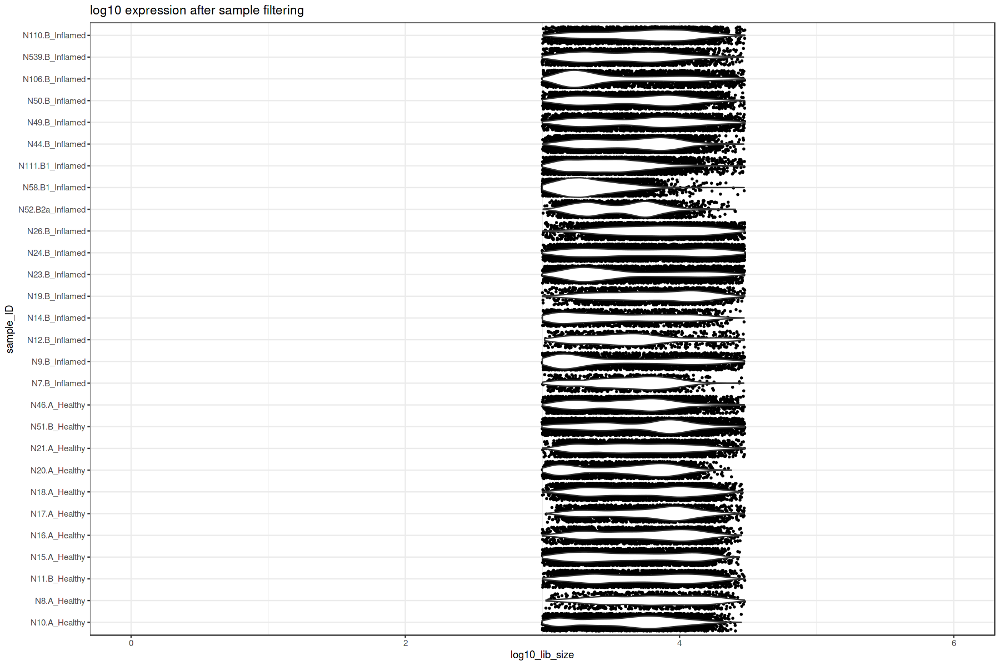

In [100]:
options(repr.plot.width=15,repr.plot.height=10)
ggplot(data = df
             ,aes(x = sample_ID
                  ,y = log10_lib_size
             )
) +
        geom_jitter(height = NULL
                    ,size = 0.5) +
        geom_violin() + 
        ggtitle("log10 expression after sample filtering") +
        coord_flip() +
        ylim(c(0,6))+
        theme_bw()

rm(df)

In [101]:
# Subset anno_samples_cf_ctf_gf_sf
anno_samples_cf_ctf_gf_sf <- anno_samples_cf_ctf_gf_sf %>%
  filter(sample_ID %in% anno_cells_cf_ctf_gf_sf$sample_ID)

In [102]:
# Subset the counts_matrix
counts_cf_ctf_gf_sf <- counts_cf_ctf_gf_sf[,anno_cells_cf_ctf_gf_sf$cell_ID]

### heatmap

In [103]:
options(repr.plot.width=15,repr.plot.height=15)

anno_cells_cf_ctf_gf_sf <- anno_cells_cf_ctf_gf_sf %>% 
  arrange(region)

df <- table(data.frame(sample_ID = anno_cells_cf_ctf_gf_sf$sample_ID
                       ,cell_type = anno_cells_cf_ctf_gf_sf$cell_type)
            )

df <- t(matrix(df
               ,ncol = ncol(df)
               ,dimnames=dimnames(df)
               )
        )

In [104]:
df <- as.data.frame(df)
df1 <- data.frame(matrix(ncol = length(unique(anno_cells_cf_ctf_gf_sf$sample_ID)), nrow = length(unique(anno_cells_cf_ctf_gf_sf$cell_type))))
colnames(df1) <- unique(anno_cells_cf_ctf_gf_sf$sample_ID)
rownames(df1) <- rownames(df)

In [105]:
for (x in colnames(df1)){
    df1[[x]] <- df[[x]]
}

In [106]:
library("circlize")
library("ComplexHeatmap")

circlize version 0.4.15
CRAN page: https://cran.r-project.org/package=circlize
Github page: https://github.com/jokergoo/circlize
Documentation: https://jokergoo.github.io/circlize_book/book/

If you use it in published research, please cite:
Gu, Z. circlize implements and enhances circular visualization
  in R. Bioinformatics 2014.

This message can be suppressed by:
  suppressPackageStartupMessages(library(circlize))


Loading required package: grid

ComplexHeatmap version 2.10.0
Bioconductor page: http://bioconductor.org/packages/ComplexHeatmap/
Github page: https://github.com/jokergoo/ComplexHeatmap
Documentation: http://jokergoo.github.io/ComplexHeatmap-reference

If you use it in published research, please cite:
Gu, Z. Complex heatmaps reveal patterns and correlations in multidimensional 
  genomic data. Bioinformatics 2016.

The new InteractiveComplexHeatmap package can directly export static 
complex heatmaps into an interactive Shiny app with zero effort. Have a try!

This mess

In [107]:
col_fun = colorRamp2(c(0
                       ,10
                       ,100
                       ,1000
                       , max(df1)), c("white"
                                     ,"lightgoldenrod1"
                                     ,"gold"
                                     ,"salmon"
                                     , "darkred"))

Warning message:
“The input is a data frame, convert it to a matrix.”


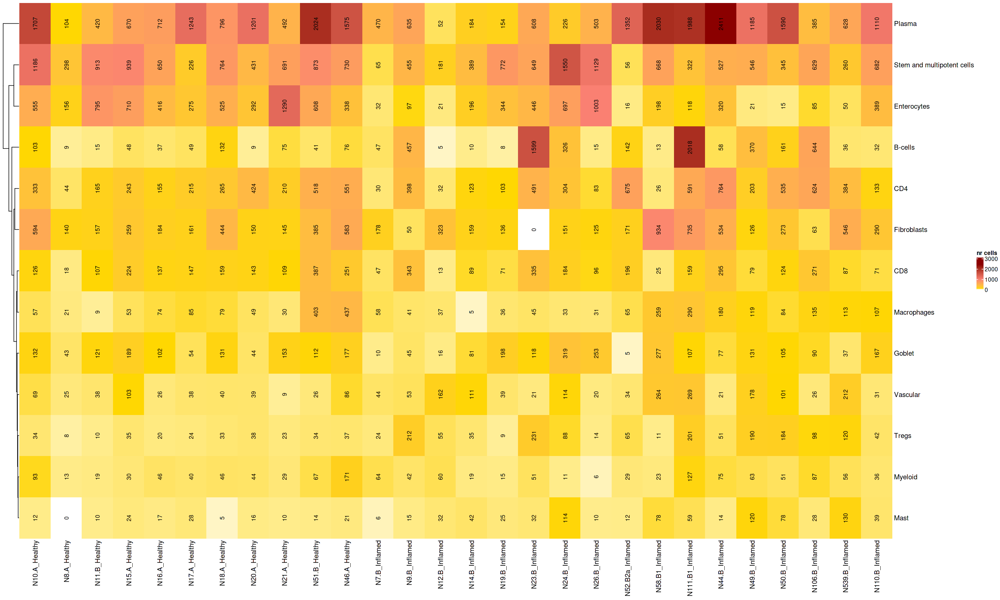

In [108]:
options(repr.plot.width=25,repr.plot.height=15)
Heatmap(df1
        ,cluster_columns = F
        ,col = col_fun
        ,name="nr cells"
        ,show_heatmap_legend = TRUE
        ,cell_fun = function(j, i, x, y, width, height, fill) {
                grid.text(as.character(df1[i, j])#sprintf("%.1f", df[i, j])
                          , x
                          , y
                          , gp = gpar(fontsize = 10
                                      )
                          ,rot=90
                          )
                }
        )

Warning message:
“The input is a data frame, convert it to a matrix.”


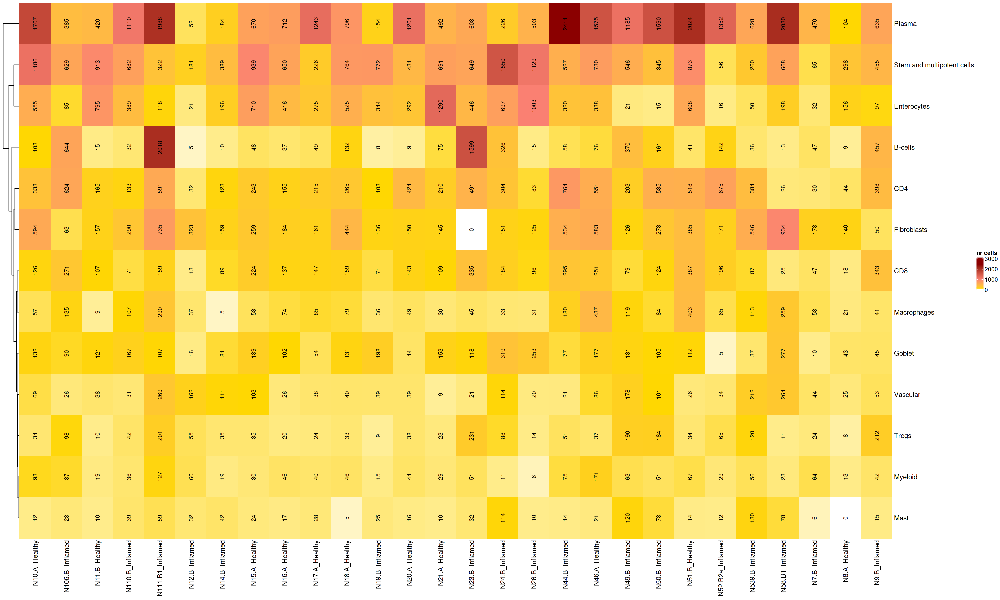

In [109]:
Heatmap(df
        ,cluster_columns = F
        ,col = col_fun
        ,name="nr cells"
        ,show_heatmap_legend = TRUE
        ,cell_fun = function(j, i, x, y, width, height, fill) {
                grid.text(as.character(df[i, j])#sprintf("%.1f", df[i, j])
                          , x
                          , y
                          , gp = gpar(fontsize = 10
                                      )
                          ,rot=90
                          )
                }
        )

### export

In [110]:
#save counts_cf_ctf_gf.RData
save(counts_cf_ctf_gf_sf, file = "../../..//results//data_preprocessing//Similie/filtered/counts_cf_ctf_gf_sf.RData")

#save anno_cells_cf_ctf_gf.RData
save(anno_cells_cf_ctf_gf_sf, file = "../../..//results//data_preprocessing//Similie/filtered/anno_cells_cf_ctf_gf_sf.RData")

#save anno_samples_cf_ctf_gf.RData
save(anno_samples_cf_ctf_gf_sf, file = "../../..//results//data_preprocessing//Similie/filtered/anno_samples_cf_ctf_gf_sf.RData")

#save anno_genes_cf_ctf_gf.RData
save(anno_genes_cf_ctf_gf_sf, file = "../../..//results//data_preprocessing//Similie/filtered/anno_genes_cf_ctf_gf_sf.RData")

In [111]:
getwd()

[1] "/home/mami/Maria/polish/clean/community-paper/src/data_preprocessing/Smillie"